In [75]:
%load_ext autoreload
%autoreload 2

import sys
import random

import pandas as pd
import matplotlib.pyplot as plt
import cv2


sys.path.append("../..")
from src.data import DataPaths, open_numpy, label_to_string
from src.image import get_image_with_id, plot_rgby
from src.transforms import five_crop_tta_transform
from pytorch_toolbox.fastai_extensions.vision.utils import tensor2img

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Generate the color maps 

#### Read in the kaggle images and the external HPAv18 images

In [5]:
kaggle_image_paths = list(DataPaths.TRAIN_COMBINED_IMAGES.glob("*"))
kaggle_labels = pd.read_csv(DataPaths.TRAIN_LABELS)
hpaV18_image_paths = list(DataPaths.TRAIN_COMBINED_IMAGES_HPAv18.glob("*"))
hpaV18_labels = pd.read_csv(DataPaths.TRAIN_LABELS_HPAv18)

In [6]:
kaggle_labels.head()

,Id,Target
0,00070df0-bbc3-11e8-b2bc-ac1f6b6435d0,16 0
1,000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0,7 1 2 0
2,000a9596-bbc4-11e8-b2bc-ac1f6b6435d0,5
3,000c99ba-bba4-11e8-b2b9-ac1f6b6435d0,1
4,001838f8-bbca-11e8-b2bc-ac1f6b6435d0,18


In [7]:
hpaV18_labels.head()

,Id,Target
0,10580_1610_C1_1,13 25 0 2 21
1,10580_1610_C1_2,13 25 0 2 21
2,10580_1756_B1_1,13 25 0 2 21
3,10580_1756_B1_2,13 25 0 2 21
4,10580_1758_B1_1,13 25 0 2 21


#### Sample one image from kaggle and get the corresponding labels from HPAv18 to see if they are different

In [8]:
same_labels_df = kaggle_labels.merge(hpaV18_labels, on=['Target'])

In [9]:
unique_kaggle_image_ids = same_labels_df['Id_x'].unique()

In [10]:
kaggle_image = random.sample(list(unique_kaggle_image_ids), 1)[0]
hpaV18_image_with_same_label_row = same_labels_df.loc[same_labels_df['Id_x'] == kaggle_image]
hpaV18_image_with_same_label = hpaV18_image_with_same_label_row['Id_y'].values
labels = hpaV18_image_with_same_label_row['Target']
labels_name = [label_to_string[int(l)] for l in labels.values[0].split(" ")]
kaggle_image_with_same_label_row = kaggle_labels.loc[kaggle_labels['Target'] ==  labels.values[0]]
kaggle_image_with_same_label = kaggle_image_with_same_label_row['Id'].values

In [12]:
image_path

PosixPath('../../data/train_combined/b809f4b8-bba4-11e8-b2ba-ac1f6b6435d0.npy')

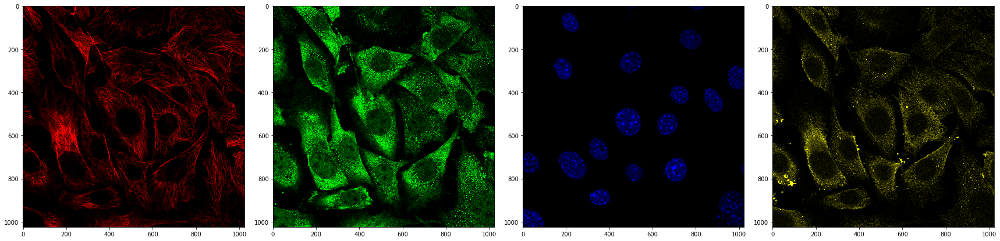

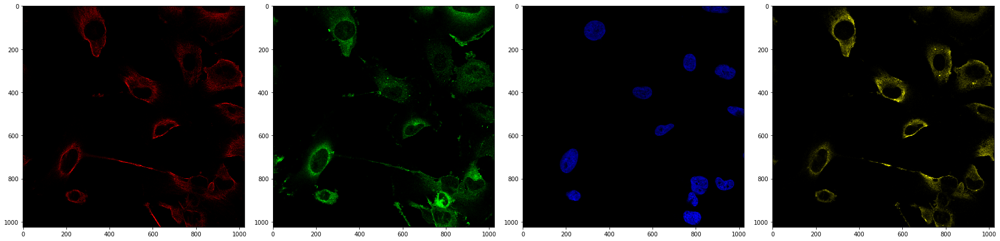

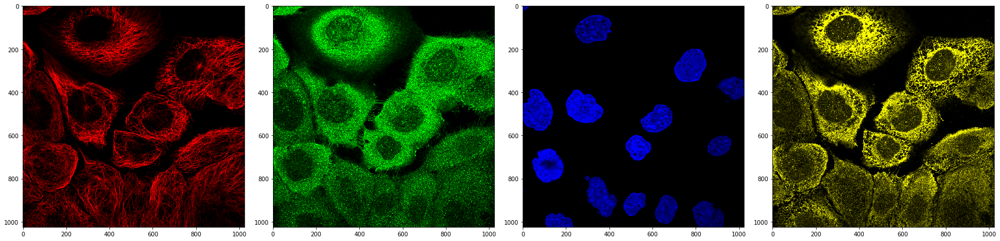

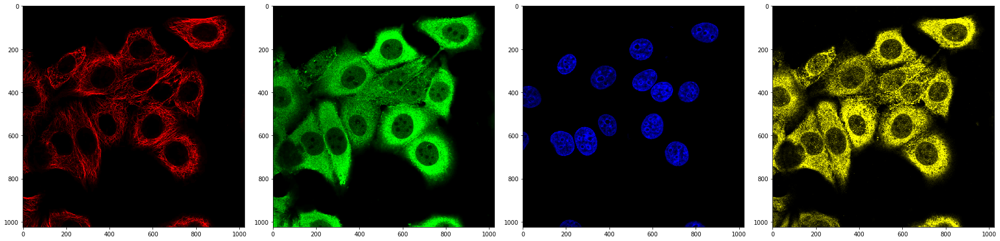

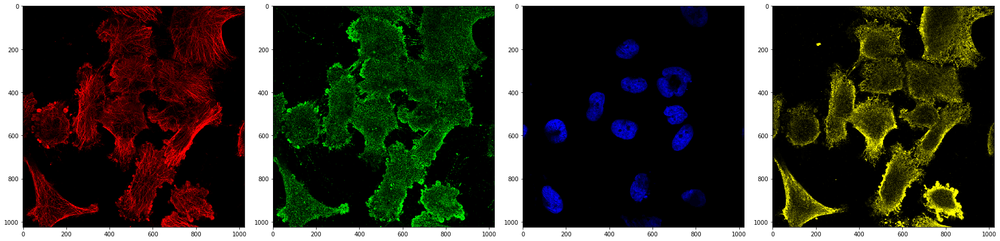

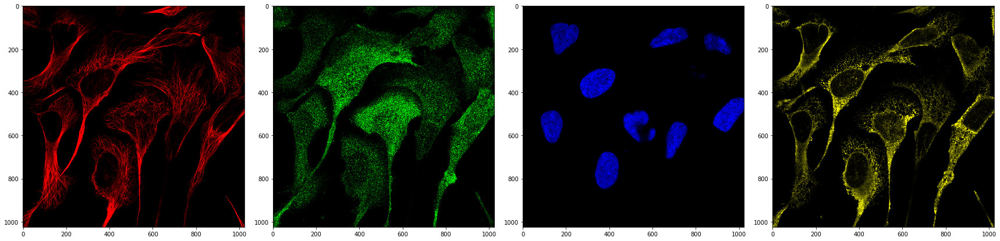

In [17]:
n_to_sample = 3
for i, image_id in enumerate(random.sample(list(kaggle_image_with_same_label), n_to_sample) + random.sample(list(hpaV18_image_with_same_label), n_to_sample)):
    image = get_image_with_id(image_id)
    plot_rgby(image)

#### Some helper functions to plot some images

In [14]:
from src.image import get_image_with_id, get_image_from_class, plot_rgby

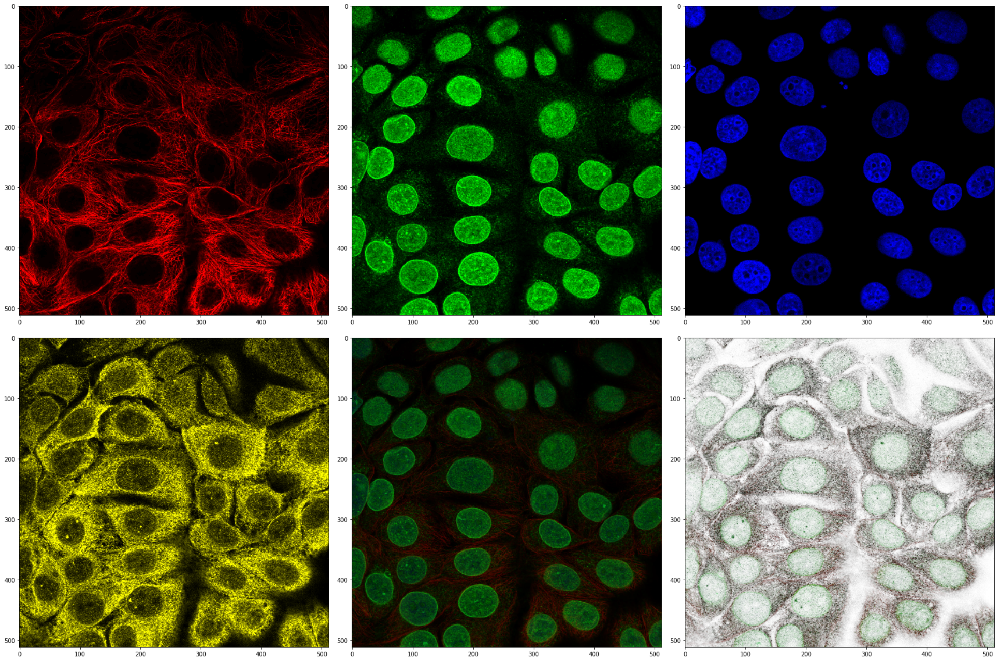

In [15]:
plot_rgby(get_image_with_id('40755_840_C12_2'))

In [20]:
get_image_from_class(class_labels=[1, 2, 3, 4, 5, 6], n_samples=1)[0]

ValueError: No images found for ['Nuclear membrane', 'Nucleoli', 'Nucleoli fibrillar center', 'Nuclear speckles', 'Nuclear bodies', 'Endoplasmic reticulum']

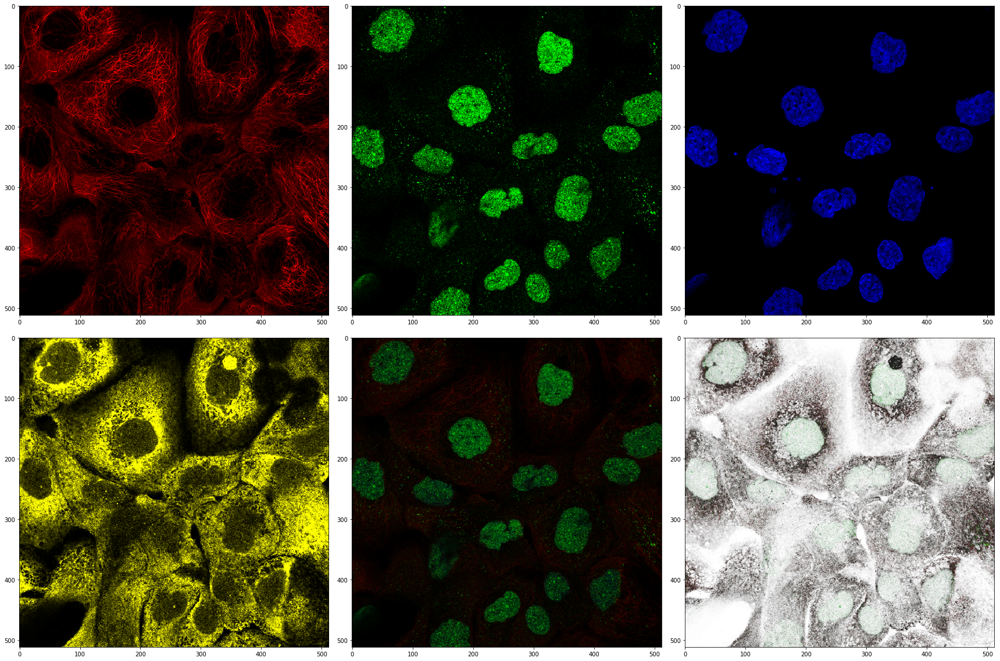

In [21]:
plot_rgby(get_image_from_class(class_labels=[1, 2, 5], n_samples=1)[0])

#### Test functions for TTA

In [41]:
img = get_image_with_id('40755_840_C12_2', with_image_wrapper=True)

In [43]:
img.px = cv2.resize(img.px, (768, 768))

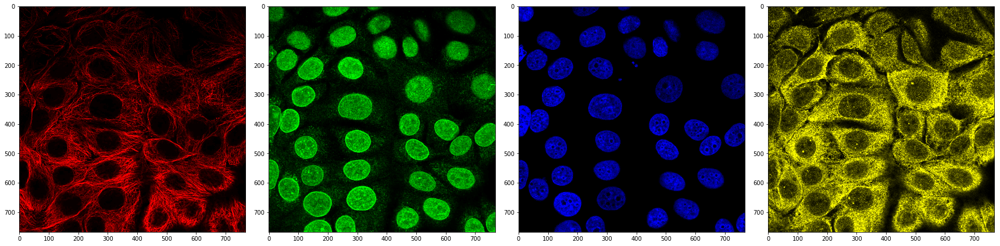

In [44]:
plot_rgby(img.px)

#### Create a 5 crop

In [81]:
tta_images = five_crop_tta_transform(img_tensor, crop_height=512, crop_width=512)

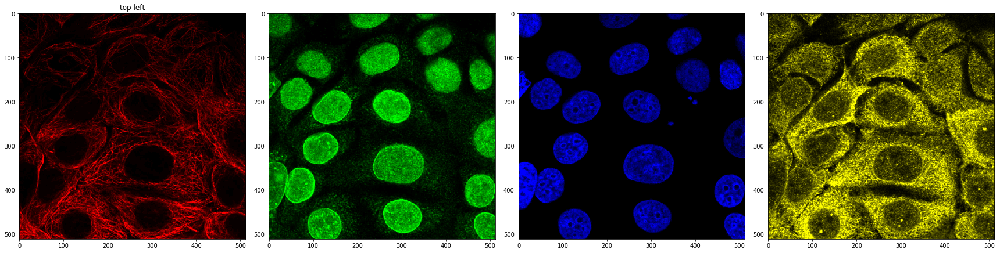

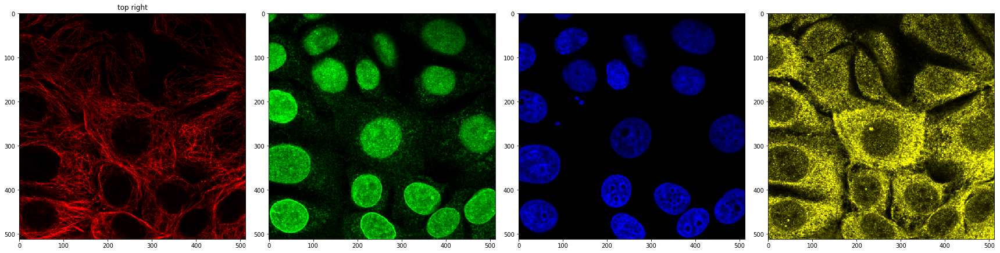

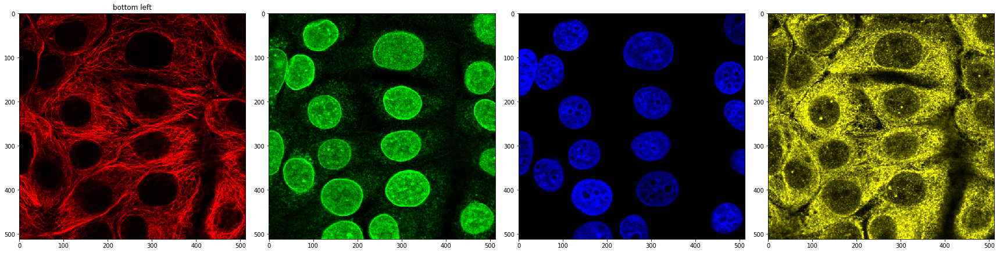

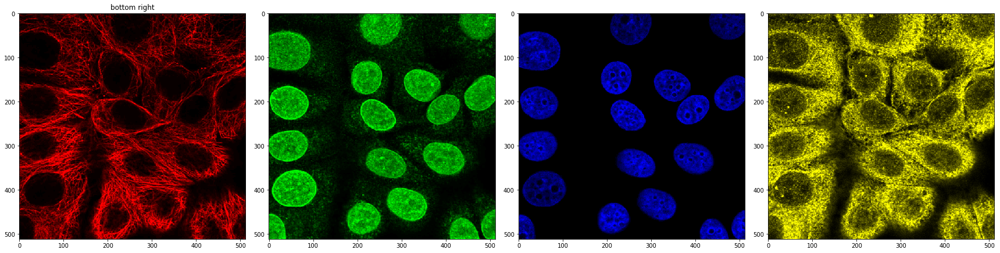

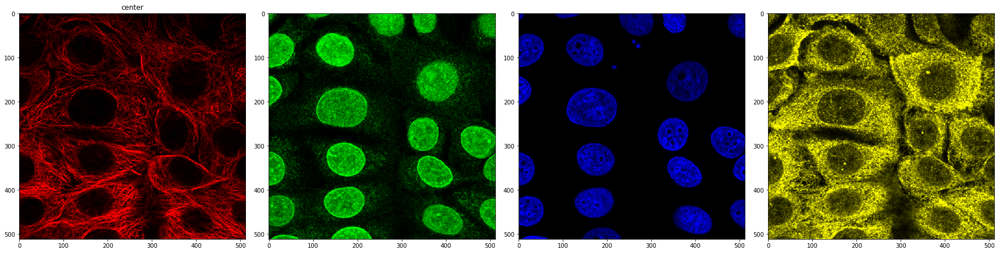

In [82]:
for ax, img, crop_position in zip(axs, tta_images, ["top left", "top right", "bottom left", "bottom right", "center"]):
    plot_rgby(tensor2img(img), title=crop_position)